In [1]:
pip install tifffile

     |████████████████████████████████| 133kB 2.8MB/s 
     |████████████████████████████████| 18.1MB 199kB/s 


In [0]:
from collections import defaultdict
import csv
import sys

import cv2
from shapely.geometry import MultiPolygon, Polygon
import shapely.wkt
import shapely.affinity
import numpy as np
import tifffile as tiff
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import average_precision_score

In [3]:
# Colab library to upload files to notebook
from google.colab import files

# Install Kaggle library
!pip install -q kaggle

uploaded = files.upload()

Saving kaggle.json to kaggle.json


In [0]:
!mkdir .kaggle

import json
token = {"username":"victorprince","key":"c9496b815c33627c6e8321bec4dbf10e"}
with open('/content/.kaggle/kaggle.json', 'w') as file:
    json.dump(token, file)


In [0]:
!chmod 600 /content/.kaggle/kaggle.json

In [0]:
!mv kaggle.json /root/

In [0]:
!cp /content/.kaggle/kaggle.json ~/.kaggle/kaggle.json

In [10]:
!kaggle competitions download -c dstl-satellite-imagery-feature-detection -f three_band.zip

100% 12.9G/12.9G [05:09<00:00, 47.9MB/s]
100% 12.9G/12.9G [05:09<00:00, 44.7MB/s]


In [11]:
!unzip \*.zip

Archive:  three_band.zip
  inflating: three_band/6010_0_0.tif  
  inflating: three_band/6010_0_1.tif  
  inflating: three_band/6010_0_2.tif  
  inflating: three_band/6010_0_3.tif  
  inflating: three_band/6010_0_4.tif  
  inflating: three_band/6010_1_0.tif  
  inflating: three_band/6010_1_1.tif  
  inflating: three_band/6010_1_2.tif  
  inflating: three_band/6010_1_3.tif  
  inflating: three_band/6010_1_4.tif  
  inflating: three_band/6010_2_0.tif  
  inflating: three_band/6010_2_1.tif  
  inflating: three_band/6010_2_2.tif  
  inflating: three_band/6010_2_3.tif  
  inflating: three_band/6010_2_4.tif  
  inflating: three_band/6010_3_0.tif  
  inflating: three_band/6010_3_1.tif  
  inflating: three_band/6010_3_2.tif  
  inflating: three_band/6010_3_3.tif  
  inflating: three_band/6010_3_4.tif  
  inflating: three_band/6010_4_0.tif  
  inflating: three_band/6010_4_1.tif  
  inflating: three_band/6010_4_2.tif  
  inflating: three_band/6010_4_3.tif  
  inflating: three_band/6010_4_4.tif  


In [0]:
# this class helps us do logistic regression
class classifier:
  # we get scaling factor here and also we flip so that it works with polygon.
  def get_scalars(self,im_size,x_max, y_min):
    h, w = im_size 
    w_ = w * (w / (w + 1))
    h_ = h * (h / (h + 1))
    return w_ / x_max, h_ / y_min

  # create a mask for polygons
  def mask_ploy(self,polygons,im_size):
    img_mask = np.zeros(im_size, np.uint8)
    if not polygons:
        return img_mask
    int_coords = lambda x: np.array(x).round().astype(np.int32)
    exteriors = [int_coords(poly.exterior.coords) for poly in polygons]
    interiors = [int_coords(pi.coords) for poly in polygons
                 for pi in poly.interiors]
    cv2.fillPoly(img_mask, exteriors, 1)
    cv2.fillPoly(img_mask, interiors, 0)
    return img_mask

  def scale_per(self,matrix):
    w, h, d = matrix.shape
    matrix = np.reshape(matrix, [w * h, d]).astype(np.float64)
    mins = np.percentile(matrix, 1, axis=0)
    maxs = np.percentile(matrix, 99, axis=0) - mins
    matrix = (matrix - mins[None, :]) / maxs[None, :]
    matrix = np.reshape(matrix, [w, h, d])
    matrix = matrix.clip(0, 1)
    return matrix

  # a helper function to show mask images
  def show_mask(self,m):
    tiff.imshow(255 * np.stack([m, m, m]));

  # coverting polygons for mask.
  def mask_to_poly(self,mask):
    epsilon=10
    min_area=10
     # first, find contours with cv2: it's much faster than shapely
    contours, hierarchy = cv2.findContours(((mask == 1) * 255).astype(np.uint8),cv2.RETR_CCOMP, cv2.CHAIN_APPROX_TC89_KCOS)
    # create approximate contours to have reasonable submission size
    approx_contours = [cv2.approxPolyDP(cnt, epsilon, True)
                       for cnt in contours]
    if not contours:
        return MultiPolygon()
    # now messy stuff to associate parent and child contours
    cnt_children = defaultdict(list)
    child_contours = set()
    assert hierarchy.shape[0] == 1
    # http://docs.opencv.org/3.1.0/d9/d8b/tutorial_py_contours_hierarchy.html
    for idx, (_, _, _, parent_idx) in enumerate(hierarchy[0]):
        if parent_idx != -1:
            child_contours.add(idx)
            cnt_children[parent_idx].append(approx_contours[idx])
    # create actual polygons filtering by area (removes artifacts)
    all_polygons = []
    for idx, cnt in enumerate(approx_contours):
        if idx not in child_contours and cv2.contourArea(cnt) >= min_area:
            assert cnt.shape[1] == 1
            poly = Polygon(
                shell=cnt[:, 0, :],
                holes=[c[:, 0, :] for c in cnt_children.get(idx, [])
                       if cv2.contourArea(c) >= min_area])
            all_polygons.append(poly)
    # approximating polygons might have created invalid ones, fix them
    all_polygons = MultiPolygon(all_polygons)
    if not all_polygons.is_valid:
        all_polygons = all_polygons.buffer(0)
        # Sometimes buffer() converts a simple Multipolygon to just a Polygon,
        # need to keep it a Multi throughout
        if all_polygons.type == 'Polygon':
            all_polygons = MultiPolygon([all_polygons])
    return all_polygons

  # this method takes image id and class identifier and calculates its jaccard similarity for that class in that image.
  def calculate(self,IM_ID,POLY_TYPE,th):

    csv.field_size_limit(sys.maxsize);

    # Load grid size
    x_max = y_min = None
    for _im_id, _x, _y in csv.reader(open('../content/grid_sizes.csv')):
        if _im_id == IM_ID:
            x_max, y_min = float(_x), float(_y)
            break

    # Load train poly with shapely
    train_polygons = None
    for _im_id, _poly_type, _poly in csv.reader(open('../content/train_wkt_v4.csv')):
        if _im_id == IM_ID and _poly_type == POLY_TYPE:
            train_polygons = shapely.wkt.loads(_poly)
            break

    # Read image with tiff
    im_rgb = tiff.imread('../content/three_band/{}.tif'.format(IM_ID)).transpose([1, 2, 0])
    im_size = im_rgb.shape[:2]


    # scaling polygons to match the image size.
    x_scaler, y_scaler = self.get_scalars(im_size,x_max, y_min)

    train_polygons_scaled = shapely.affinity.scale(
        train_polygons, xfact=x_scaler, yfact=y_scaler, origin=(0, 0, 0))

    train_mask = self.mask_ploy(train_polygons_scaled,im_size)

    tiff.imshow(255 * self.scale_per(im_rgb[:,:]));

    self.show_mask(train_mask[:,:])

    xs = im_rgb.reshape(-1, 3).astype(np.float32)
    ys = train_mask.reshape(-1)
    pipeline = make_pipeline(StandardScaler(), SGDClassifier(loss='log'))
    print('training...')
    # do not care about overfitting here
    pipeline.fit(xs, ys)
    pred_ys = pipeline.predict_proba(xs)[:, 1]
    print('average precision', average_precision_score(ys, pred_ys))
    pred_mask = pred_ys.reshape(train_mask.shape)
    self.show_mask(pred_mask[:,:])
    threshold = th
    pred_binary_mask = pred_mask >= threshold
    self.show_mask(pred_binary_mask[:,:])

    tp, fp, fn = (( pred_binary_mask &  train_mask).sum(),
                  ( pred_binary_mask & ~train_mask).sum(),
                  (~pred_binary_mask &  train_mask).sum())
    print('Pixel jaccard', tp / (tp + fp + fn))
    pred_polygons = self.mask_to_poly(pred_binary_mask)
    pred_poly_mask = self.mask_ploy(pred_polygons,im_size)
    self.show_mask(pred_poly_mask[:,:])

    scaled_pred_polygons = shapely.affinity.scale(
        pred_polygons, xfact=1 / x_scaler, yfact=1 / y_scaler, origin=(0, 0, 0))

    dumped_prediction = shapely.wkt.dumps(scaled_pred_polygons)
    print('Prediction size: {:,} bytes'.format(len(dumped_prediction)))
    final_polygons = shapely.wkt.loads(dumped_prediction)

    print('Final jaccard',
          final_polygons.intersection(train_polygons).area /
          final_polygons.union(train_polygons).area)


training...
average precision 0.6285350301687296
Pixel jaccard 0.4801472500325055
Prediction size: 26,825 bytes
Final jaccard 0.2788572291364154


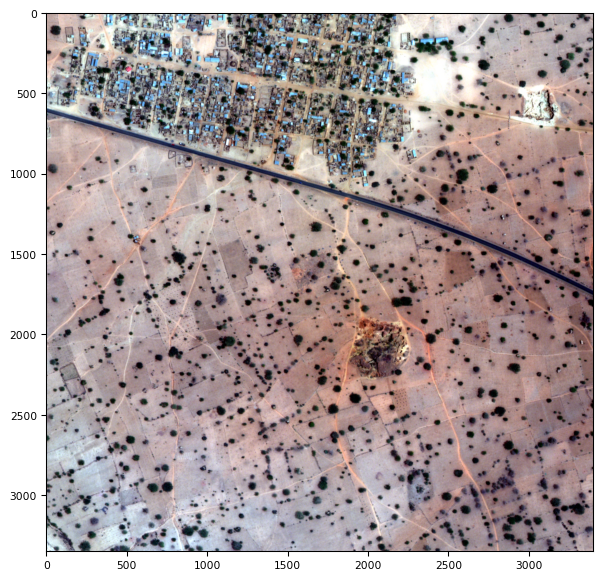

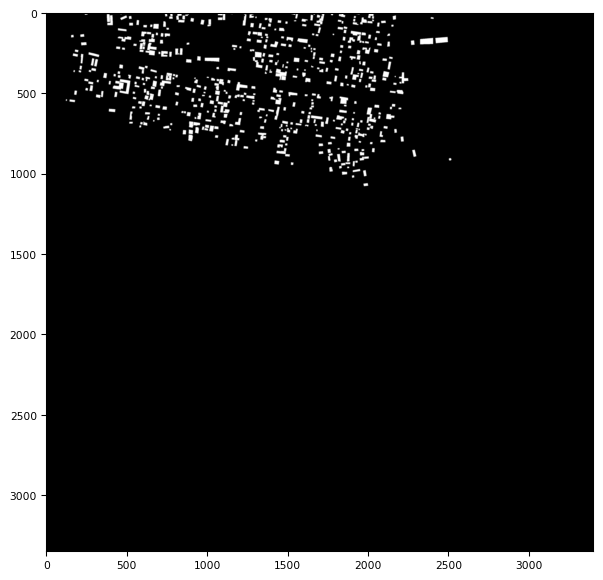

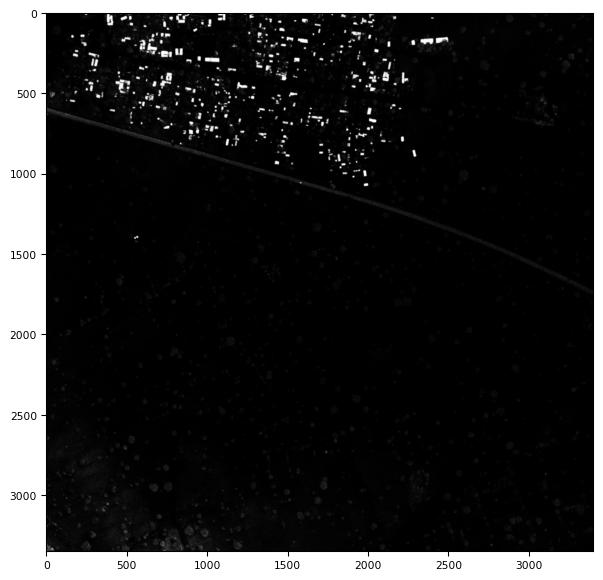

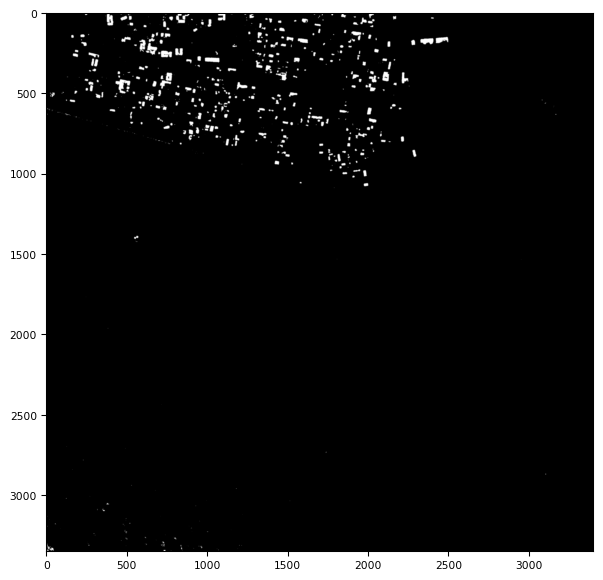

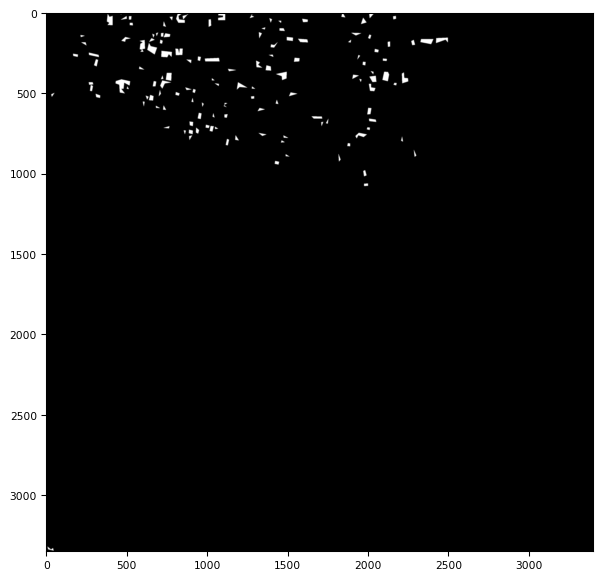

In [13]:
classi = classifier();
classi.calculate('6120_2_0','1',0.3) 


training...
average precision 0.05635153474164126
Pixel jaccard 0.012772640753877037
Prediction size: 1,893 bytes
Final jaccard 0.0


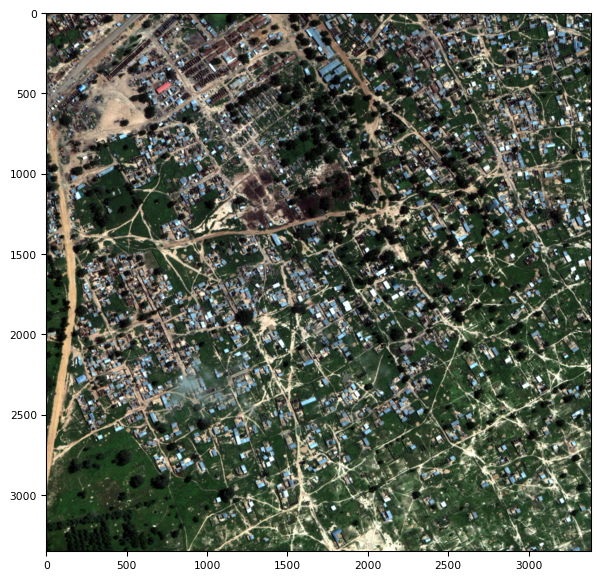

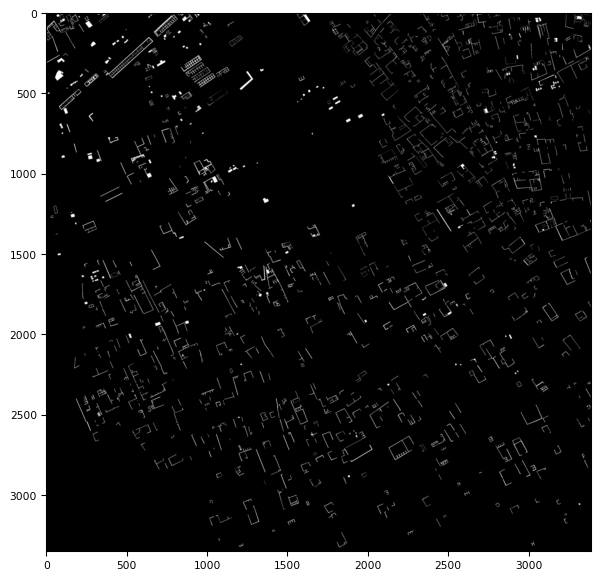

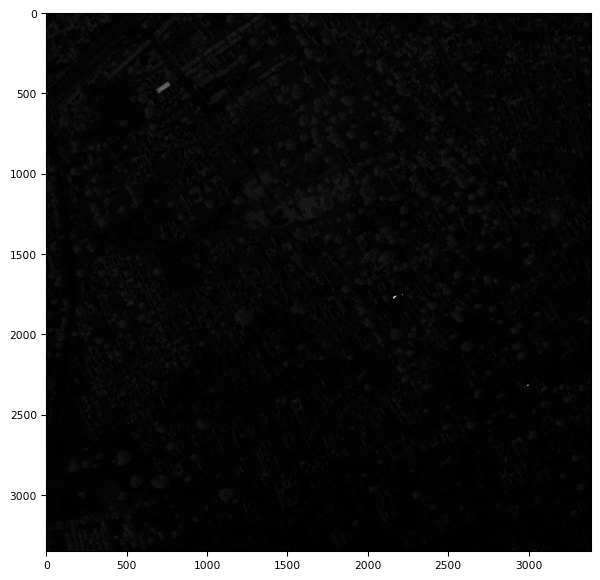

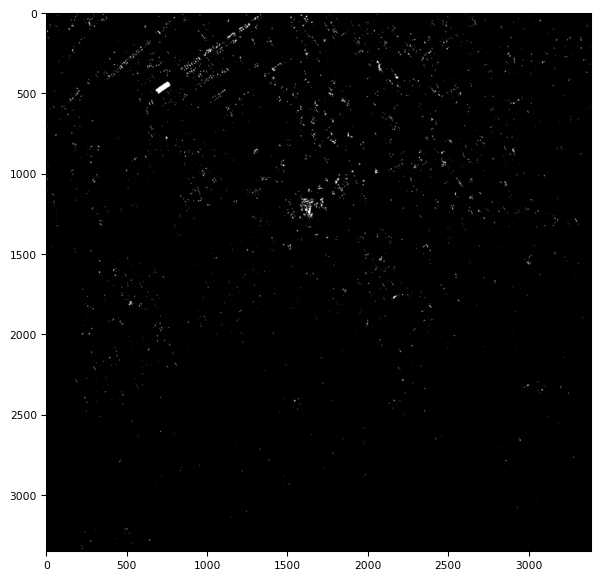

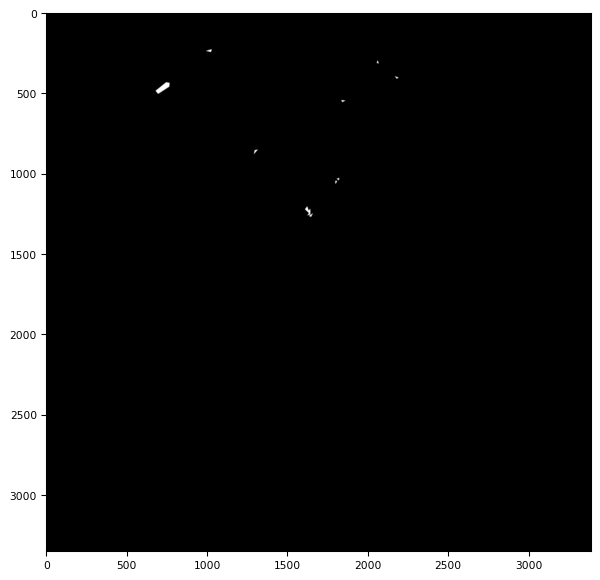

In [0]:
classi.calculate('6100_2_3','2',0.1) 

training...
average precision 0.3327957317434311
Pixel jaccard 0.2506496411915538
Prediction size: 19,398 bytes
Final jaccard 0.2571611354406838


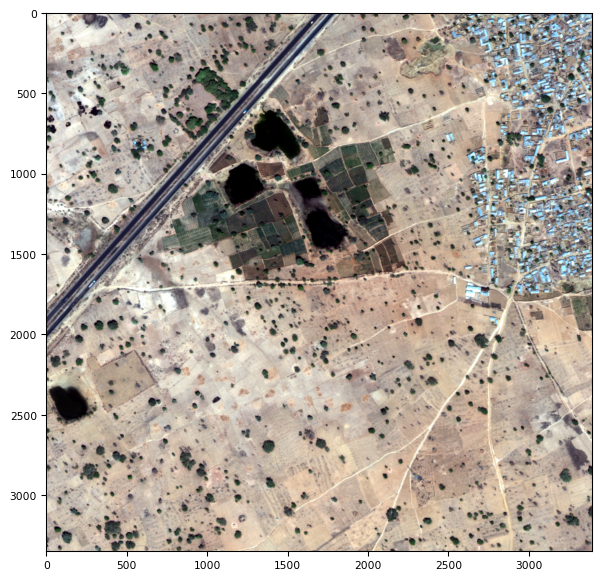

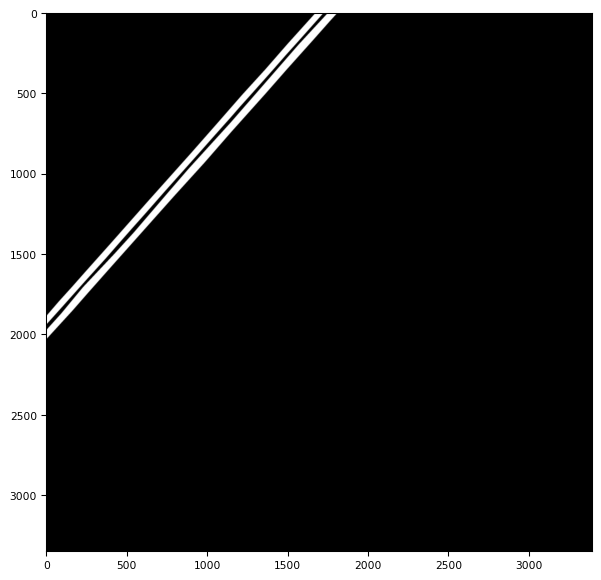

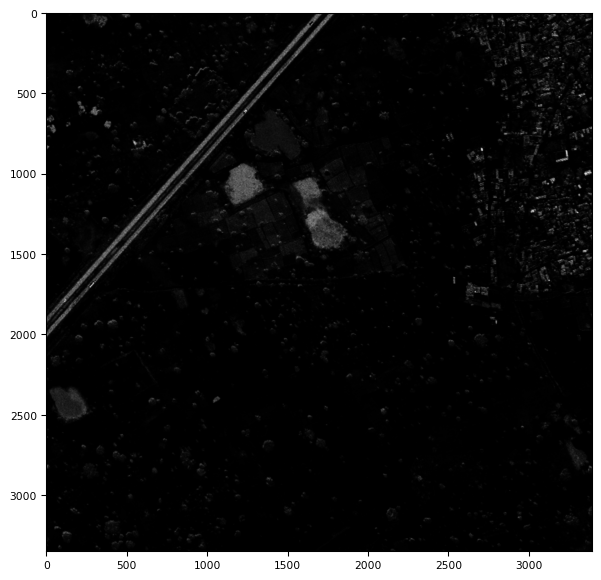

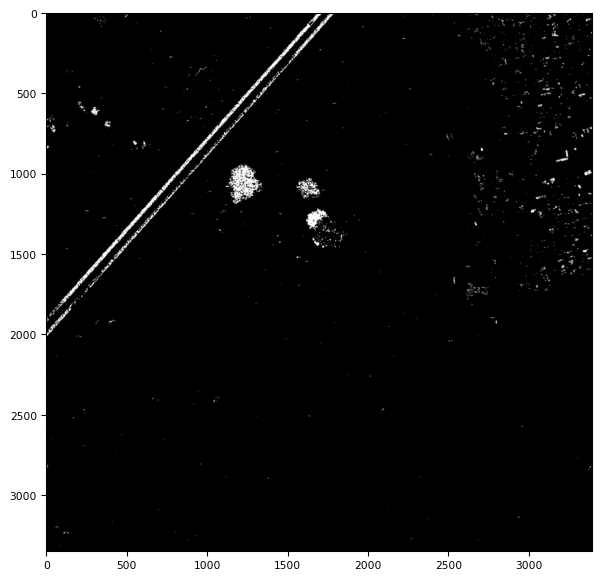

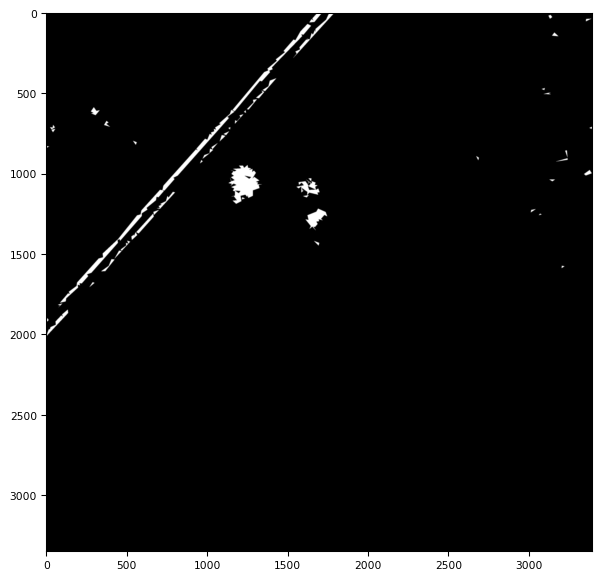

In [0]:
classi.calculate('6110_4_0','3',0.3) 

training...
average precision 0.08593265330147794
Pixel jaccard 0.031774572860060704
Prediction size: 16,167 bytes
Final jaccard 0.011846601621224362


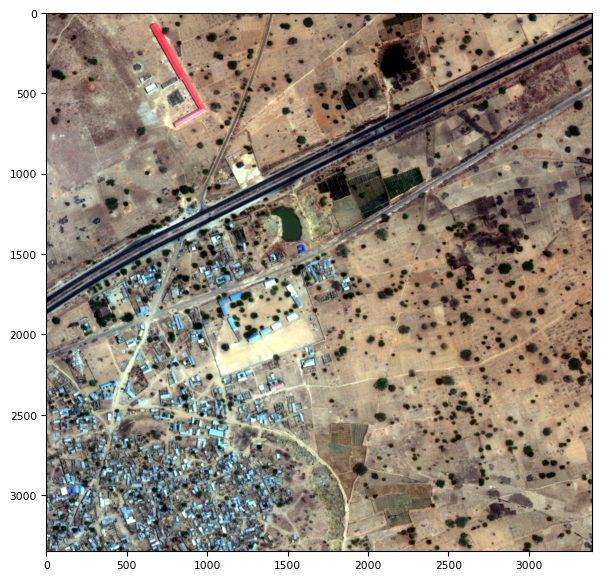

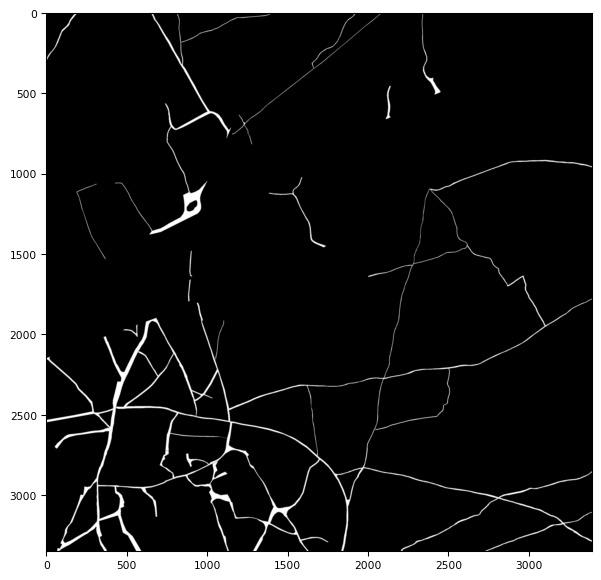

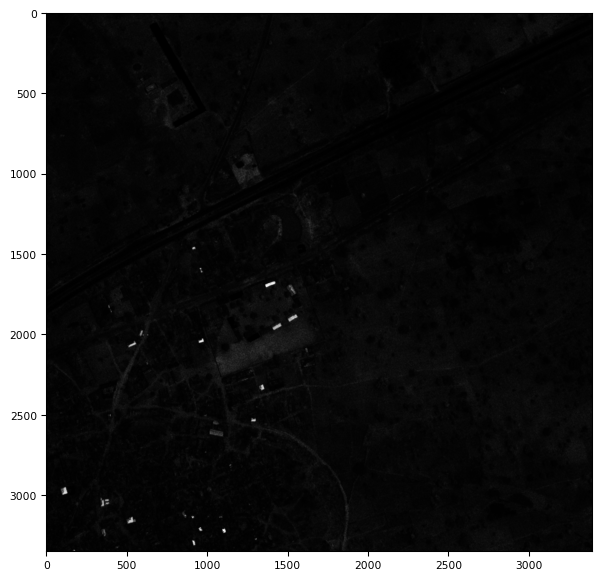

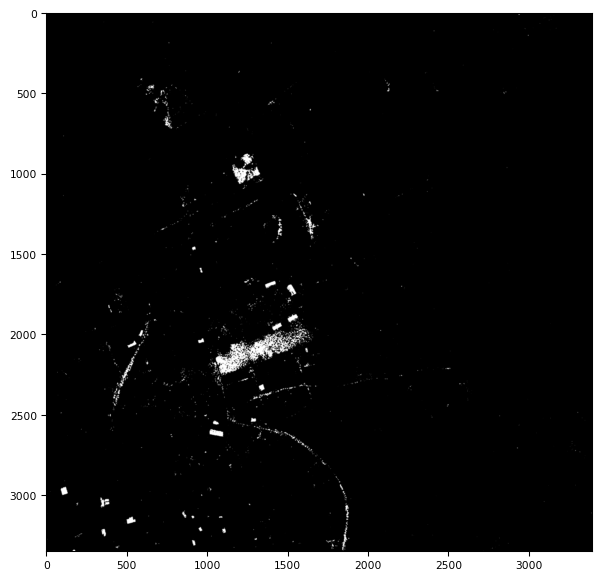

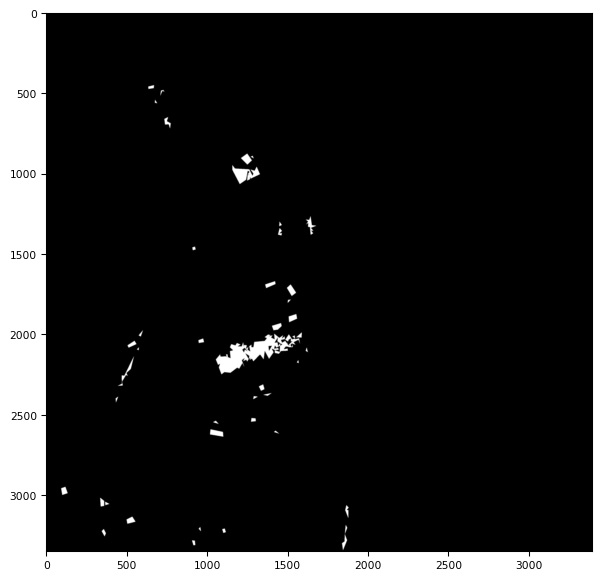

In [0]:
classi.calculate('6140_3_1','4',0.1) 

training...
average precision 0.8824686478161867
Pixel jaccard 0.678348223873545
Prediction size: 203,445 bytes
Final jaccard 0.580204248085221


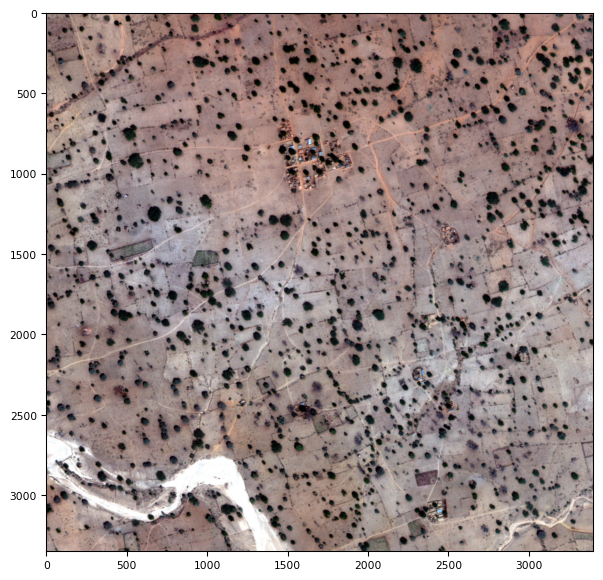

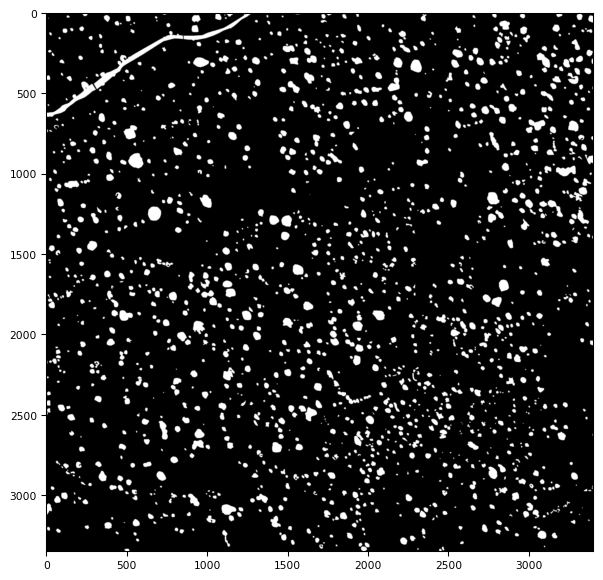

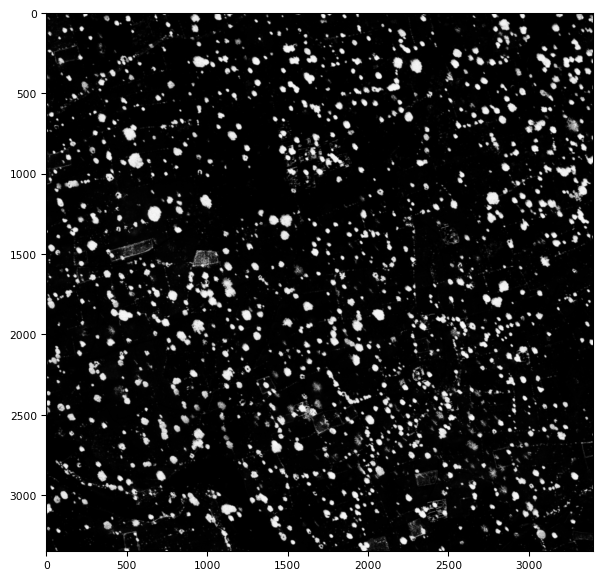

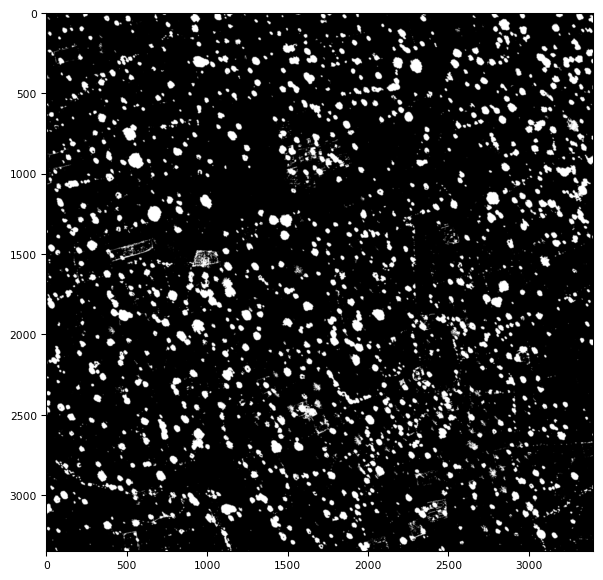

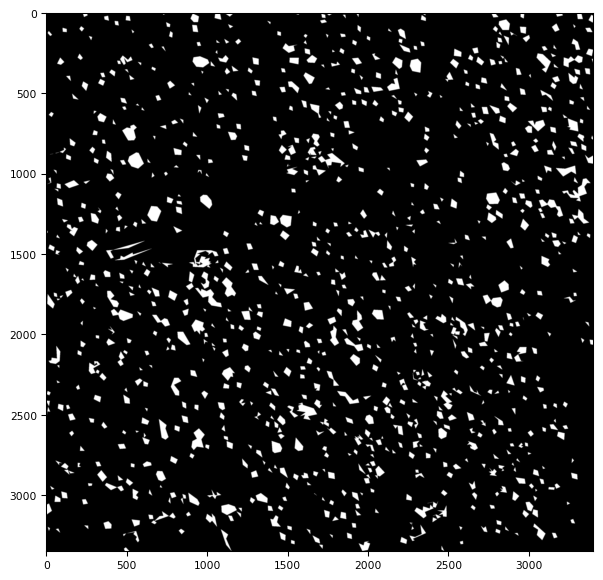

In [0]:
classi.calculate('6060_2_3','5',0.3) 

training...
average precision 0.10175631379739888
Pixel jaccard 0.0
Prediction size: 1,473 bytes
Final jaccard 0.0


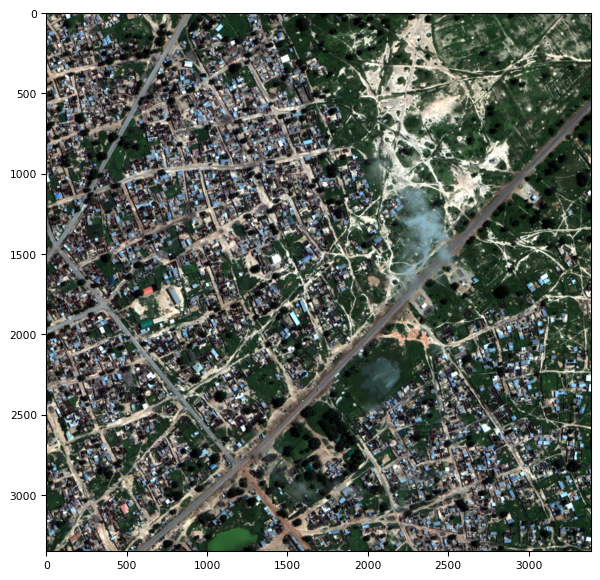

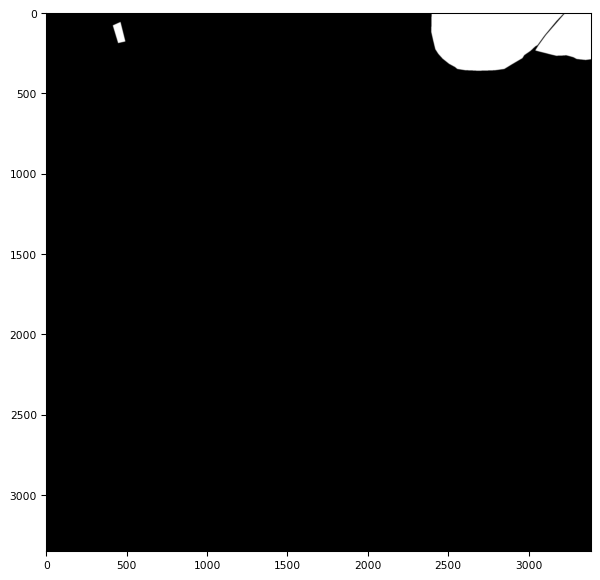

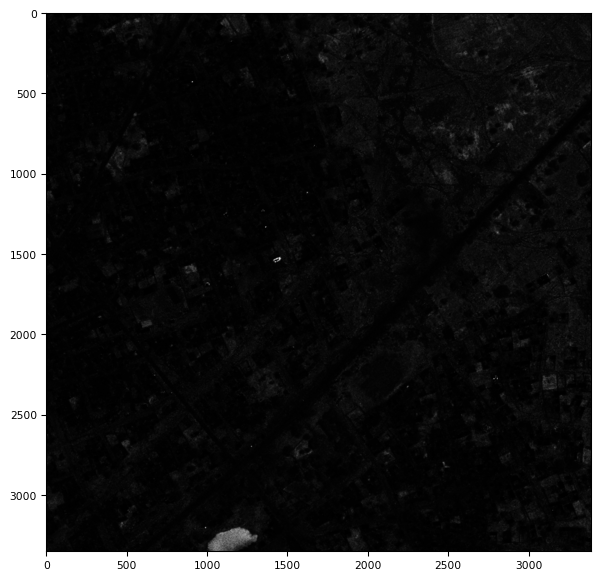

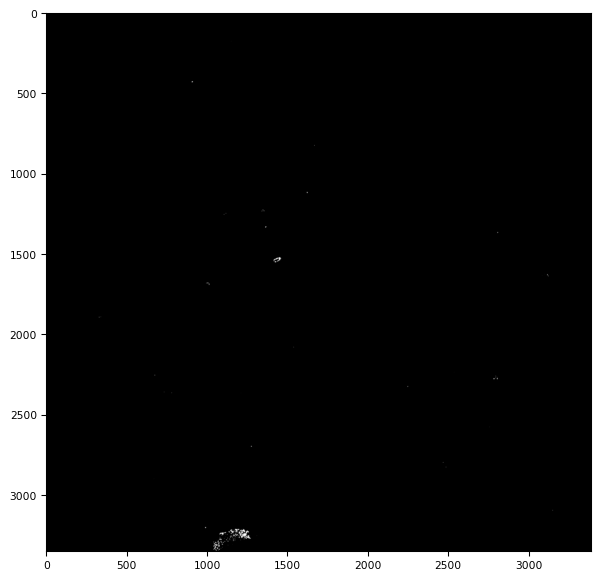

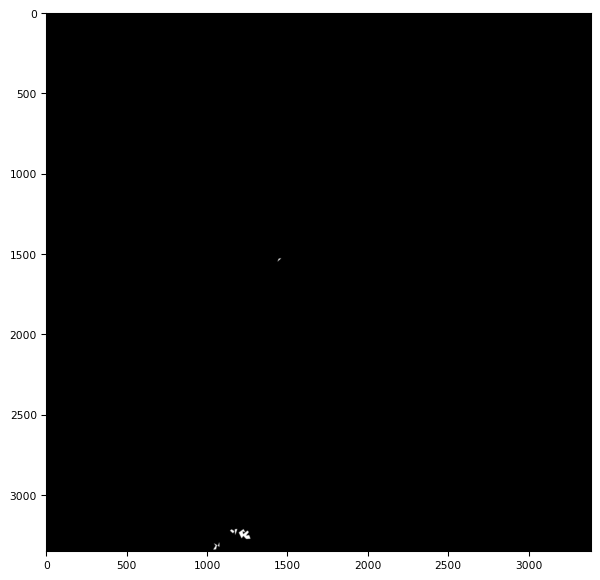

In [14]:
classi.calculate('6100_1_3','6',0.5) 

training...
average precision 0.6883285756429964
Pixel jaccard 0.4653592083349788
Prediction size: 83,577 bytes
Final jaccard 0.5056449503126997


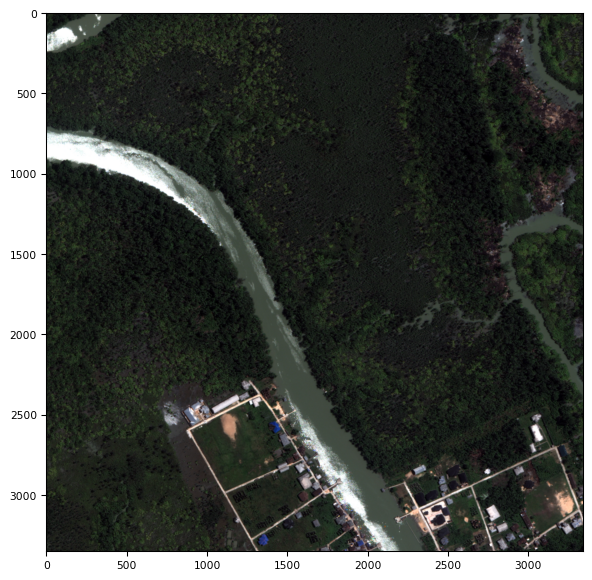

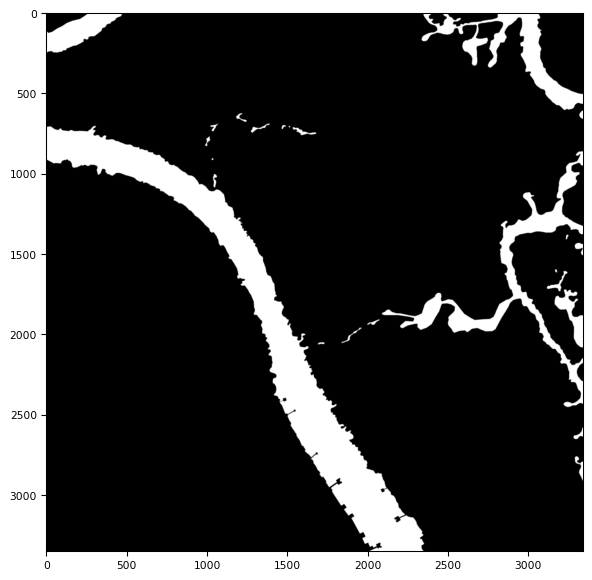

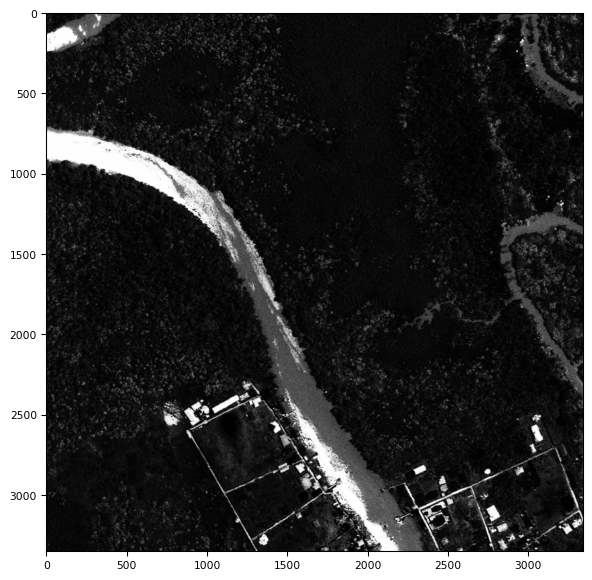

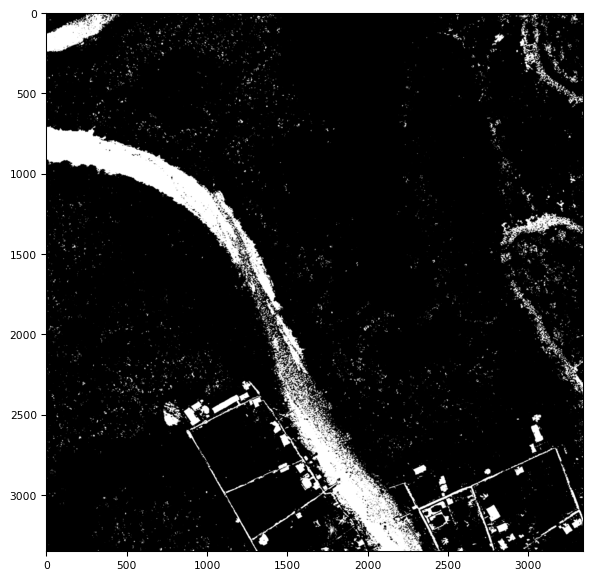

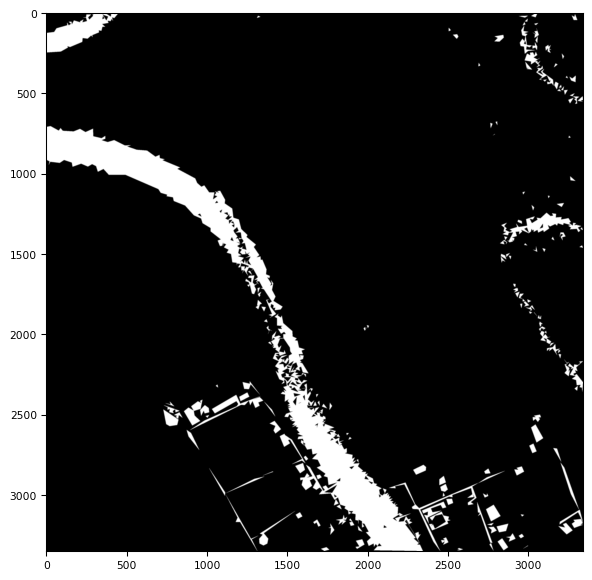

In [0]:
classi.calculate('6070_2_3','7',0.3) 

training...
average precision 0.17297593083123303
Pixel jaccard 0.14935022529876577
Prediction size: 7,629 bytes
Final jaccard 0.24937236680907926


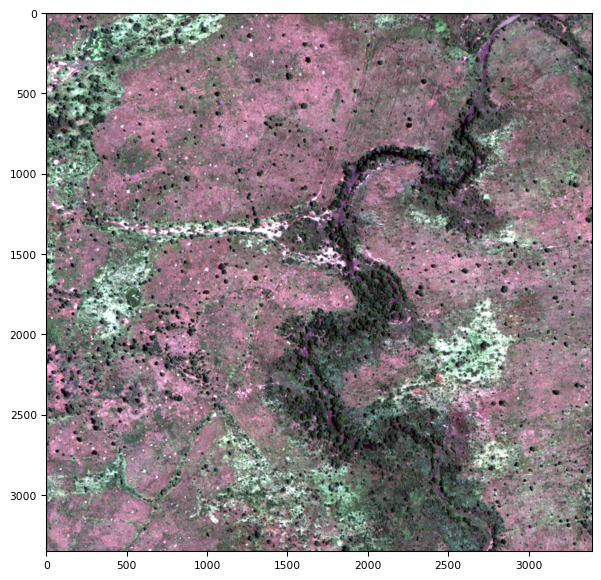

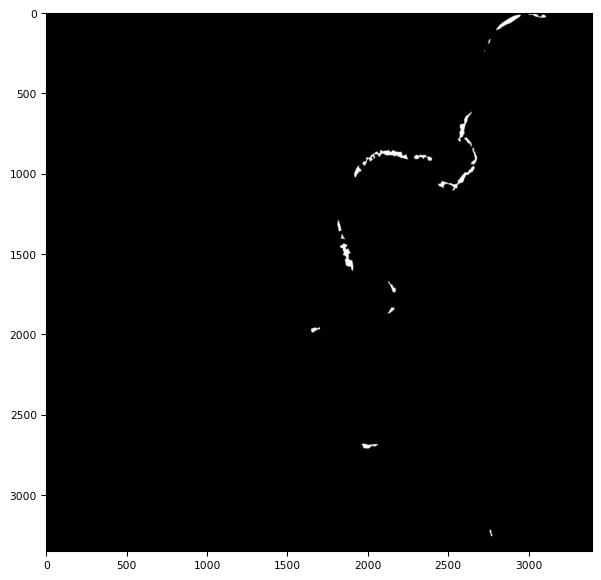

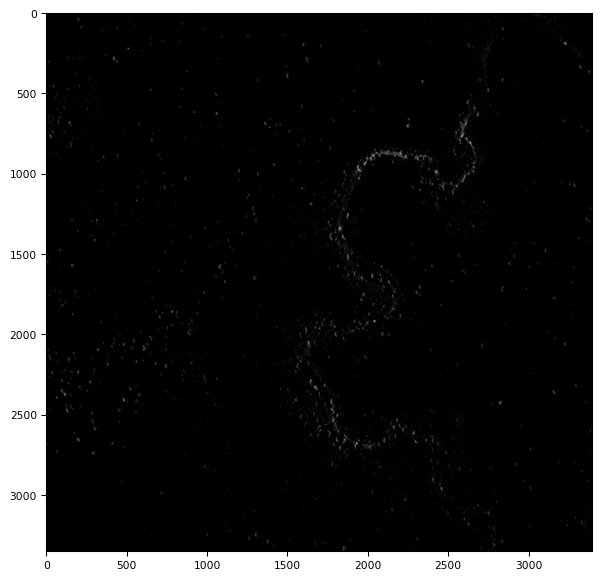

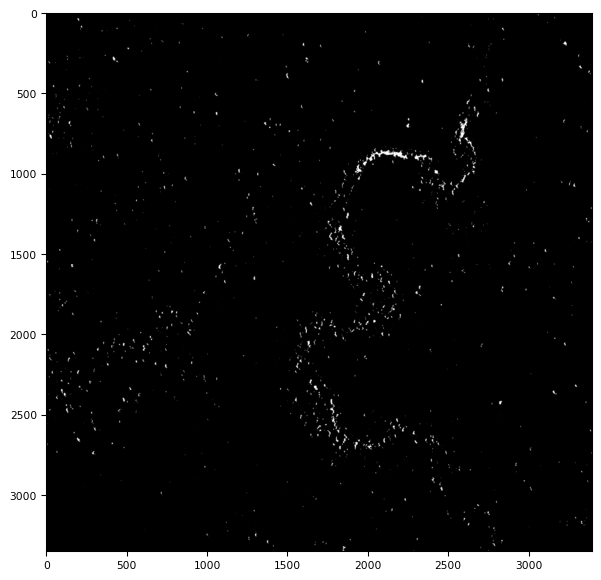

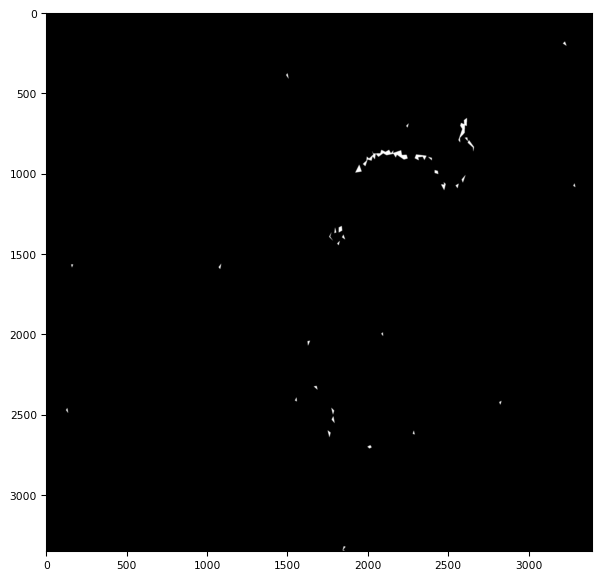

In [0]:
classi.calculate('6090_2_0','8',0.1) 

training...
average precision 0.0012192507638987078
Pixel jaccard 0.0
Prediction size: 24 bytes
Final jaccard 0.0


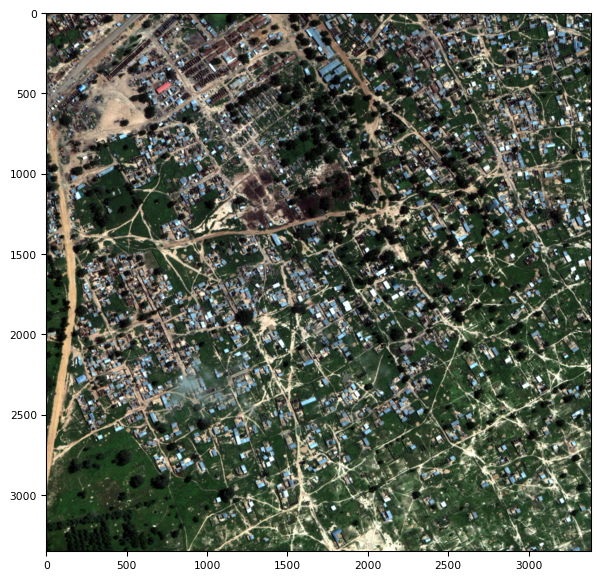

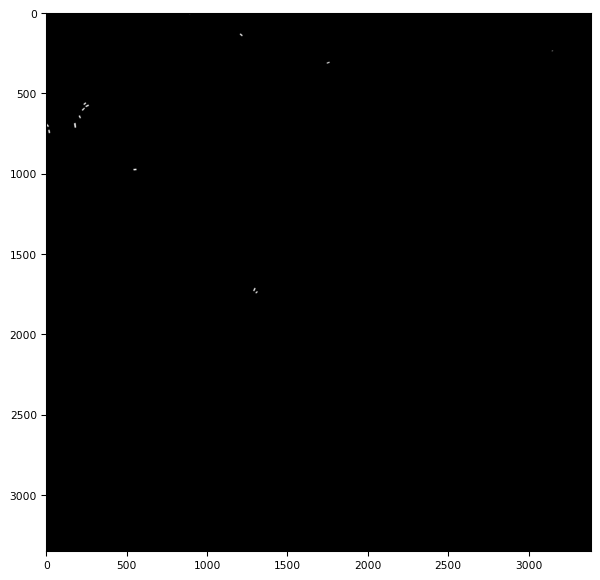

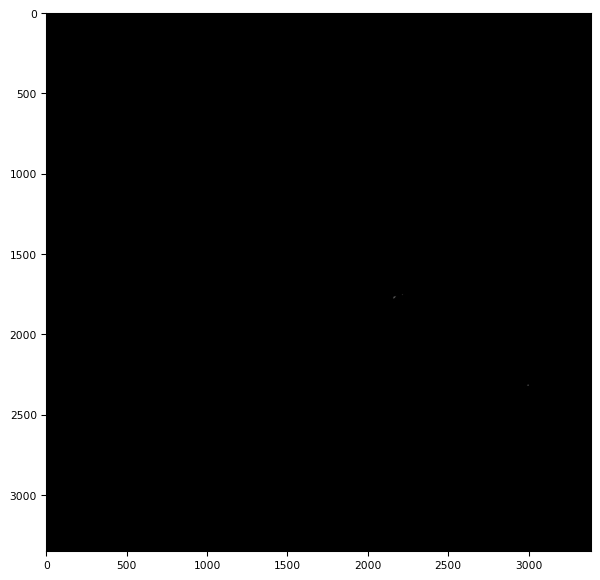

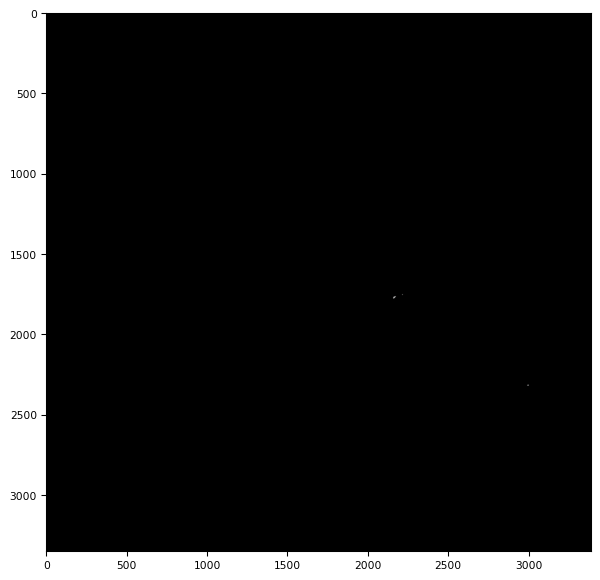

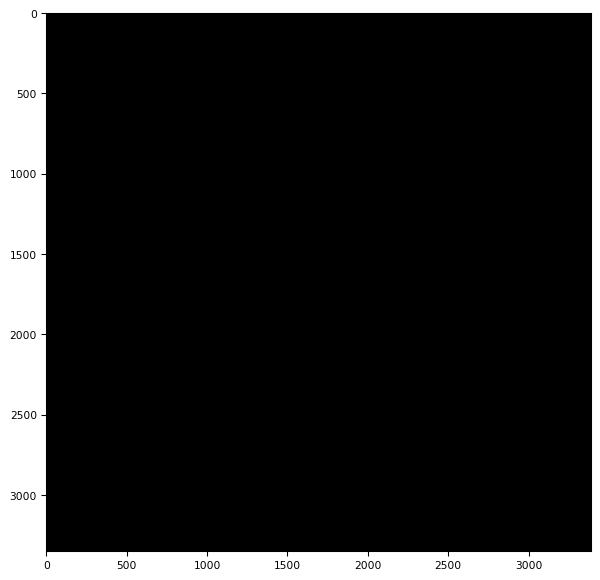

In [0]:
classi.calculate('6100_2_3','9',0.1) 

training...
average precision 0.0022098897351643283
Pixel jaccard 0.0
Prediction size: 24 bytes
Final jaccard 0.0


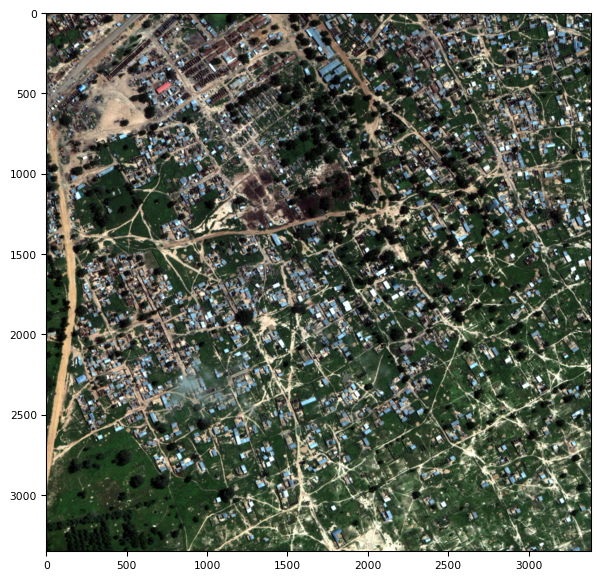

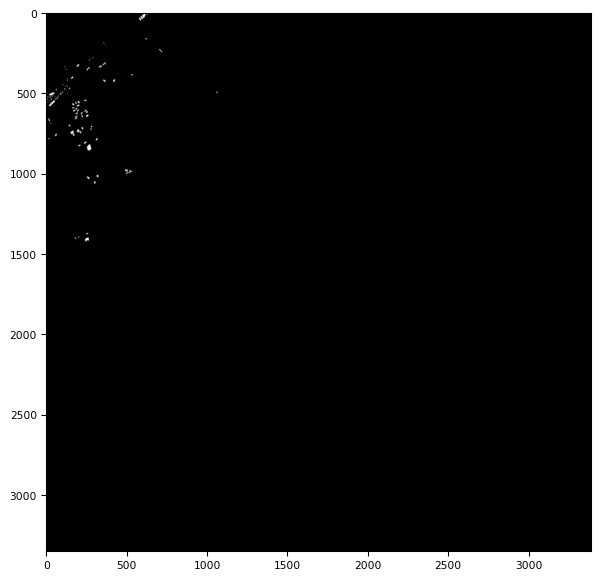

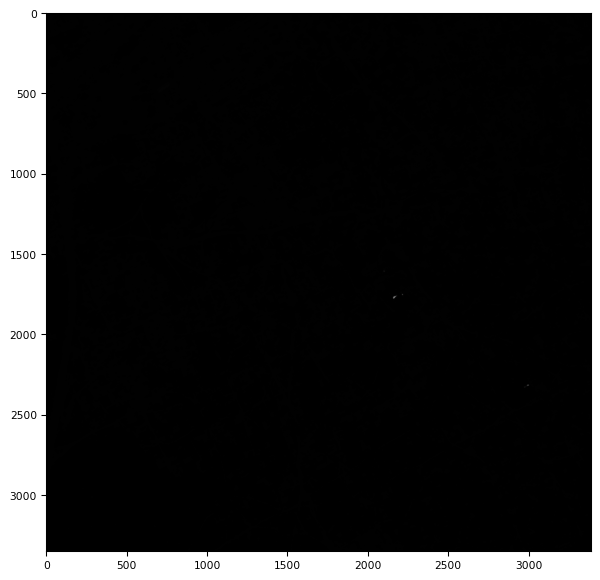

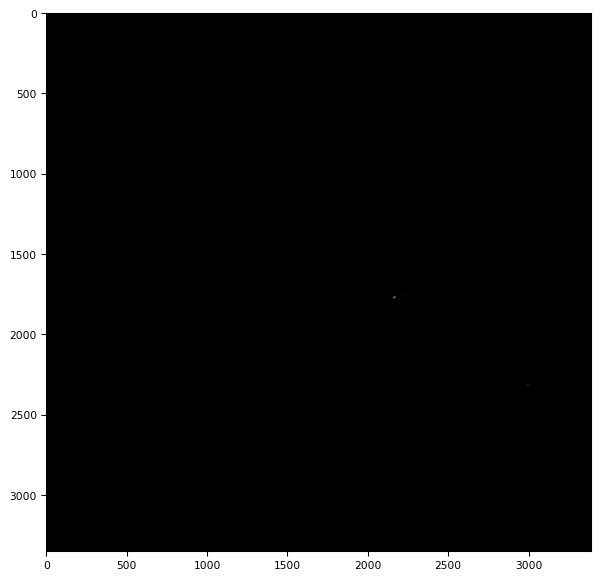

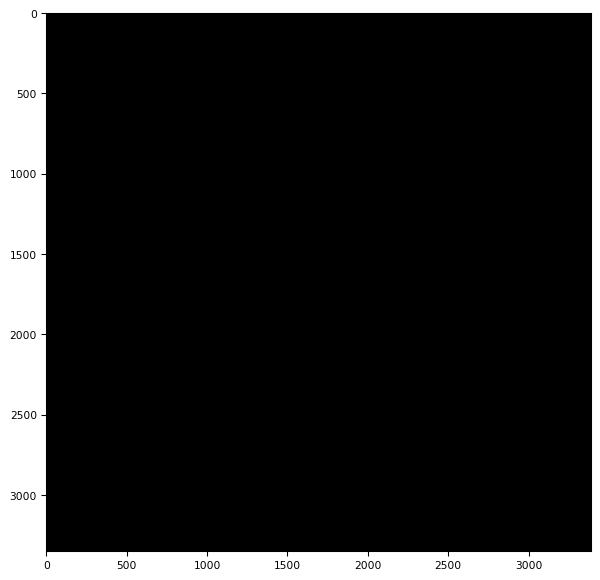

In [0]:
classi.calculate('6100_2_3','10',0.1) 